**Diabetes Health Indicator Dataset**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd /content/drive/MyDrive/CSE475_Lab/assignment_01

/content/drive/MyDrive/CSE475_Lab/assignment_01


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, VotingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer


Data Showing

In [ ]:
df = pd.read_csv('diabetes.csv')
df.head()

,Diabetes_binary,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,0.0,1.0,1.0,1.0,40.0,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,5.0,18.0,15.0,1.0,0.0,9.0,4.0,3.0
1,0.0,0.0,0.0,0.0,25.0,1.0,0.0,0.0,1.0,0.0,...,0.0,1.0,3.0,0.0,0.0,0.0,0.0,7.0,6.0,1.0
2,0.0,1.0,1.0,1.0,28.0,0.0,0.0,0.0,0.0,1.0,...,1.0,1.0,5.0,30.0,30.0,1.0,0.0,9.0,4.0,8.0
3,0.0,1.0,0.0,1.0,27.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,0.0,0.0,0.0,0.0,11.0,3.0,6.0
4,0.0,1.0,1.0,1.0,24.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,3.0,0.0,0.0,0.0,11.0,5.0,4.0


Data Pre Processing

In [ ]:
X = df.drop(['Education','Income','Diabetes_binary'], axis=1)
y = df['Diabetes_binary']-1

categorical_features = X.select_dtypes(include=['object']).columns
numerical_features = X.select_dtypes(include=['int64', 'float64']).columns

scaler = StandardScaler()
scaled_numerical_data = scaler.fit_transform(X[numerical_features])

encoder = OneHotEncoder(drop='first')
encoded_categorical_data = encoder.fit_transform(X[categorical_features])

processed_data = np.hstack([scaled_numerical_data, encoded_categorical_data.toarray()])

final_columns = numerical_features.tolist() + encoder.get_feature_names_out(categorical_features).tolist()
final_df = pd.DataFrame(processed_data, columns=final_columns)

data_X = final_df.copy()

In [ ]:
data_X.head()

,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,HvyAlcoholConsump,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age
0,1.153688,1.165254,0.196922,1.757936,1.120927,-0.205637,-0.322458,-1.762814,-1.316872,0.482087,-0.244014,0.226863,-0.303173,2.329121,1.998592,1.233999,2.223615,-0.887021,0.316900
1,-0.866785,-0.858182,-5.078164,-0.511806,1.120927,-0.205637,-0.322458,0.567275,-1.316872,-2.074316,-0.244014,-4.407954,3.298445,0.457294,-0.429630,-0.486592,-0.449718,-0.887021,-0.337933
2,1.153688,1.165254,0.196922,-0.057858,-0.892119,-0.205637,-0.322458,-1.762814,0.759375,-2.074316,-0.244014,0.226863,3.298445,2.329121,3.617407,2.954590,2.223615,-0.887021,0.316900
3,1.153688,-0.858182,0.196922,-0.209174,-0.892119,-0.205637,-0.322458,0.567275,0.759375,0.482087,-0.244014,0.226863,-0.303173,-0.478619,-0.429630,-0.486592,-0.449718,-0.887021,0.971733
4,1.153688,1.165254,0.196922,-0.663122,-0.892119,-0.205637,-0.322458,0.567275,0.759375,0.482087,-0.244014,0.226863,-0.303173,-0.478619,-0.024926,-0.486592,-0.449718,-0.887021,0.971733


Generating Histogram for Visualizing Correlation

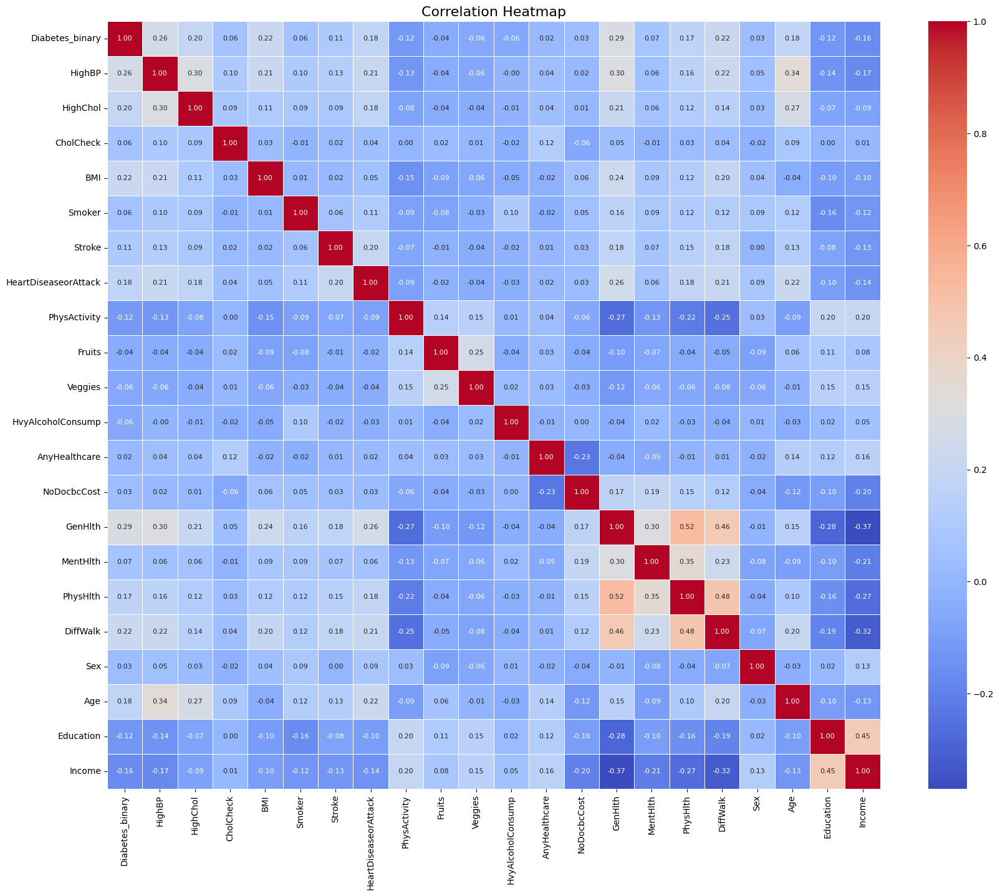

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

corr_matrix = df.corr()

plt.figure(figsize=(20, 16))

sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5, annot_kws={'size': 8})
plt.title('Correlation Heatmap', fontsize=16)
plt.show()

Data Split & Training

In [ ]:
X = data_X
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

Model Training

##Bagging Approach
Random Forest

In [ ]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)
rf_pred = rf_model.predict(X_test)
print("Random Forest Accuracy:", accuracy_score(y_test, rf_pred))

Random Forest Accuracy: 0.8543637653736992


##Boosting Approach
Gradient Boosting

In [ ]:
gb_model = GradientBoostingClassifier(n_estimators=100, random_state=42)
gb_model.fit(X_train, y_train)
gb_pred = gb_model.predict(X_test)
print("Gradient Boosting Accuracy:", accuracy_score(y_test, gb_pred))


Gradient Boosting Accuracy: 0.8678256070640177


#Stacking Approach

In [ ]:
from sklearn.ensemble import StackingClassifier
from xgboost import XGBClassifier


base_learners = [
    ('rf', RandomForestClassifier(n_estimators=100, random_state=42)),
    ('gb', GradientBoostingClassifier(n_estimators=100, random_state=42)),
    ('xgb', XGBClassifier(n_estimators=100, random_state=42))
]

meta_learner = LogisticRegression()

stacking_model = StackingClassifier(estimators = base_learners, final_estimator = meta_learner, cv = 5)
stacking_model.fit(X_train, y_train)
stacking_pred = stacking_model.predict(X_test)
print("Stacking Model Accuracy: ", accuracy_score(y_test, stacking_pred))


Stacking Model Accuracy:  0.8665444654683065


##Voting Classifer

In [ ]:
vote_model = VotingClassifier(
    estimators=[
        ('rf', RandomForestClassifier(n_estimators=100, random_state=42)),
        ('gb', GradientBoostingClassifier(n_estimators=100, random_state=42)),
        ('lr', LogisticRegression())
    ],
    voting='soft'
)
vote_model.fit(X_train, y_train)
vote_pred = vote_model.predict(X_test)
print("Voting Classifier Accuracy:", accuracy_score(y_test, vote_pred))


Voting Classifier Accuracy: 0.8666035950804163


##Evaluation

In [ ]:
print("Random Forest: ", accuracy_score(y_test, rf_pred))
print("Gradient Boosting:", accuracy_score(y_test, gb_pred))
print("Stacking Model:", accuracy_score(y_test, stacking_pred))
print("Voting Classifier: ", accuracy_score(y_test, vote_pred))

Random Forest:  0.8543637653736992
Gradient Boosting: 0.8678256070640177
Stacking Model: 0.8665444654683065
Voting Classifier:  0.8666035950804163


##Cross Validation Performance Comparison

In [ ]:
from sklearn.model_selection import cross_val_score

models = {
    "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42),
    "Gradient Boosting": GradientBoostingClassifier(n_estimators=100, random_state=42),
    "Stacking": StackingClassifier(
        estimators=[
            ('rf', RandomForestClassifier(n_estimators=100, random_state = 42)),
            ('lr', LogisticRegression())
        ],
        final_estimator=LogisticRegression()
    ),
    "Voting" : VotingClassifier(
        estimators = [
            ('rf', RandomForestClassifier(n_estimators = 100, random_state = 42)),
            ('gb', GradientBoostingClassifier(n_estimators = 100, random_state = 42)),3
            ('lr', LogisticRegression())
        ],
        voting = 'soft'
    )
}

results = {}
for model_name, model in models.items():
    scores = cross_val_score(model, data_X, y, cv=5, scoring='accuracy')
    results[model_name] = scores
    print(f"{model_name} Cross-Validation Accuracy: {scores.mean(): .4f} ± {scores.std():.4f}")


Random Forest Cross-Validation Accuracy:  0.8527 ± 0.0016
Gradient Boosting Cross-Validation Accuracy:  0.8663 ± 0.0007
Stacking Cross-Validation Accuracy:  0.8635 ± 0.0023
Voting Cross-Validation Accuracy:  0.8653 ± 0.0006


## Vizualizing Cross Validation Results

<ipython-input-19-64803e8a6308>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(


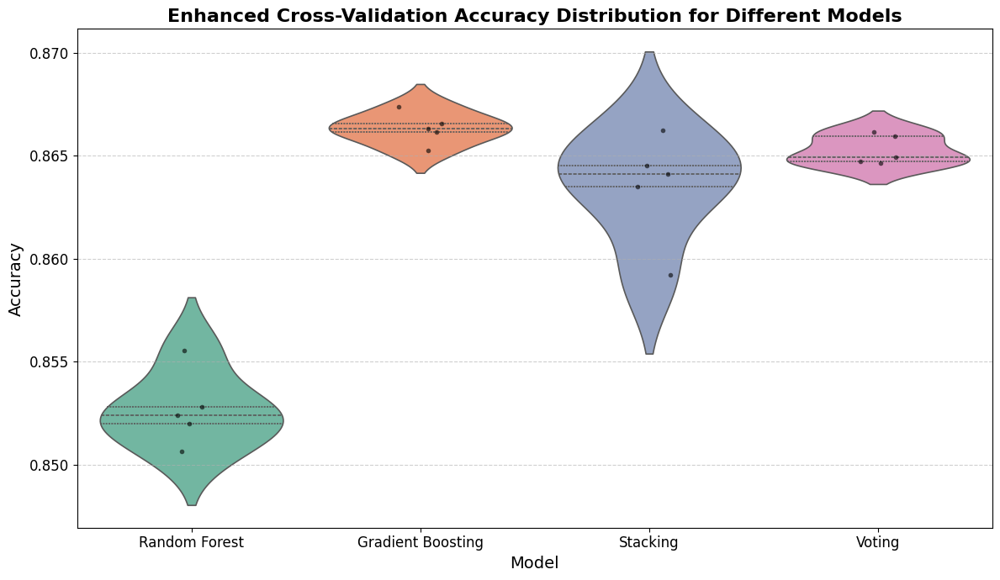

In [ ]:
# Improved Violin Plot
plt.figure(figsize=(12, 7))
sns.violinplot(
    x='Model',
    y='Accuracy',
    data=cv_results_df,
    inner='quart',
    palette='Set2',  # Set2 palette for better colors
    linewidth=1.2  # Add borders for clarity
)

# Add individual data points for better insight
sns.stripplot(
    x='Model',
    y='Accuracy',
    data=cv_results_df,
    color='black',
    alpha=0.6,
    jitter=True,
    size=4,
    marker='o'
)

# Add titles and labels
plt.title('Enhanced Cross-Validation Accuracy Distribution for Different Models', fontsize=16, fontweight='bold')
plt.xlabel('Model', fontsize=14)
plt.ylabel('Accuracy', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# Add grid for better readability
plt.grid(axis='y', linestyle='--', alpha=0.6)

# Show the plot
plt.tight_layout()
plt.show()


##Precision and Recall for Each Model

In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score

# Fit each model on the training data and calculate precision, recall, and F1-score
for model_name, model in models.items():
    # Fit the model and predict on test set
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # Calculate precision, recall, and F1-score
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')

    # Print the metrics
    print(f"{model_name} Performance Metrics:")
    print(f" - Precision: {precision:.4f}")
    print(f" - Recall: {recall:.4f}")
    print(f" - F1 Score: {f1:.4f}\n")


Random Forest Performance Metrics:
 - Precision: 0.8222
 - Recall: 0.8544
 - F1 Score: 0.8312

Gradient Boosting Performance Metrics:
 - Precision: 0.8378
 - Recall: 0.8678
 - F1 Score: 0.8358

Stacking Performance Metrics:
 - Precision: 0.8349
 - Recall: 0.8656
 - F1 Score: 0.8372

Voting Performance Metrics:
 - Precision: 0.8351
 - Recall: 0.8666
 - F1 Score: 0.8339



Summary Of Metrics

In [ ]:
# Collect all metrics in a DataFrame for summary
metrics_summary = []

for model_name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')

    metrics_summary.append({
        "Model": model_name,
        "Accuracy": accuracy,
        "Precision": precision,
        "Recall": recall,
        "F1 Score": f1
    })

# Convert to DataFrame
import pandas as pd
metrics_df = pd.DataFrame(metrics_summary)

# Display the summary
print("Model Performance Summary:")
metrics_df

Model Performance Summary:


,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,0.854364,0.822174,0.854364,0.831225
1,Gradient Boosting,0.867826,0.837769,0.867826,0.835764
2,Stacking,0.865598,0.834921,0.865598,0.837238
3,Voting,0.866604,0.835079,0.866604,0.833884


Visualizing Model Comparison

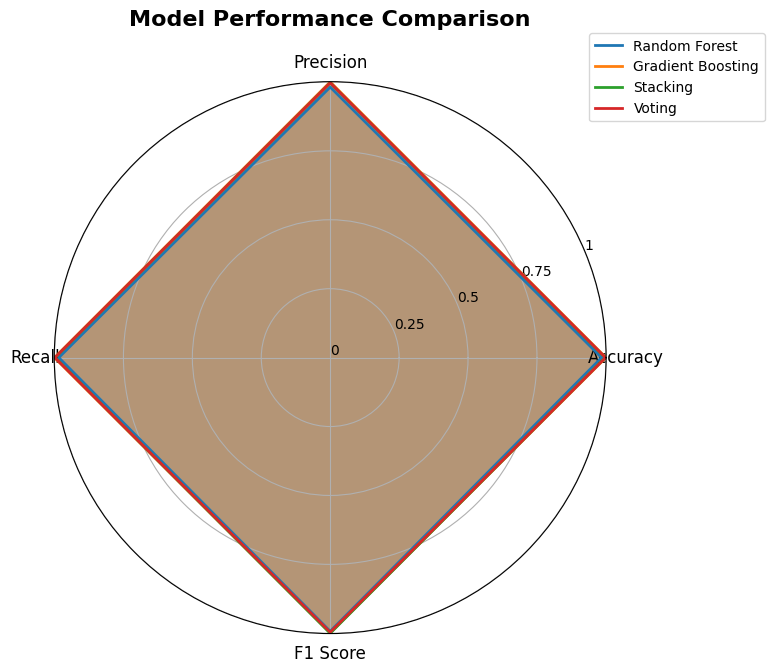

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Normalize metric values between 0 and 1
metrics_df_normalized = metrics_df.copy()
metrics_df_normalized.iloc[:, 1:] = metrics_df.iloc[:, 1:] / metrics_df.iloc[:, 1:].max()

# Prepare data for the radar chart
categories = list(metrics_df.columns[1:])  # Metrics (Accuracy, Precision, Recall, F1 Score)
num_vars = len(categories)

# Add the first metric again to close the radar chart
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
angles += angles[:1]

# Start the plot
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))

# Plot each model's metrics
for i, row in metrics_df_normalized.iterrows():
    values = row[1:].tolist()
    values += values[:1]  # Close the radar chart
    ax.plot(angles, values, linewidth=2, linestyle='solid', label=row['Model'])
    ax.fill(angles, values, alpha=0.25)

# Customize the chart
ax.set_yticks(np.linspace(0, 1, 5))  # Y-axis ticks
ax.set_yticklabels(["0", "0.25", "0.5", "0.75", "1"], fontsize=10)
ax.set_xticks(angles[:-1])  # X-axis ticks
ax.set_xticklabels(categories, fontsize=12)
ax.set_title("Model Performance Comparison", fontsize=16, fontweight="bold", pad=20)

# Add legend
ax.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1), fontsize=10)

# Show the plot
plt.tight_layout()
plt.show()


##Explainable AI(XAI)

SHAP

In [ ]:
!pip install shap
import shap

# Use a subset of the data for SHAP to reduce computation time
X_sample = X_test.sample(100, random_state=42)

# Initialize SHAP explainer for the Random Forest model
explainer = shap.TreeExplainer(rf_model)
shap_values = explainer.shap_values(X_sample)

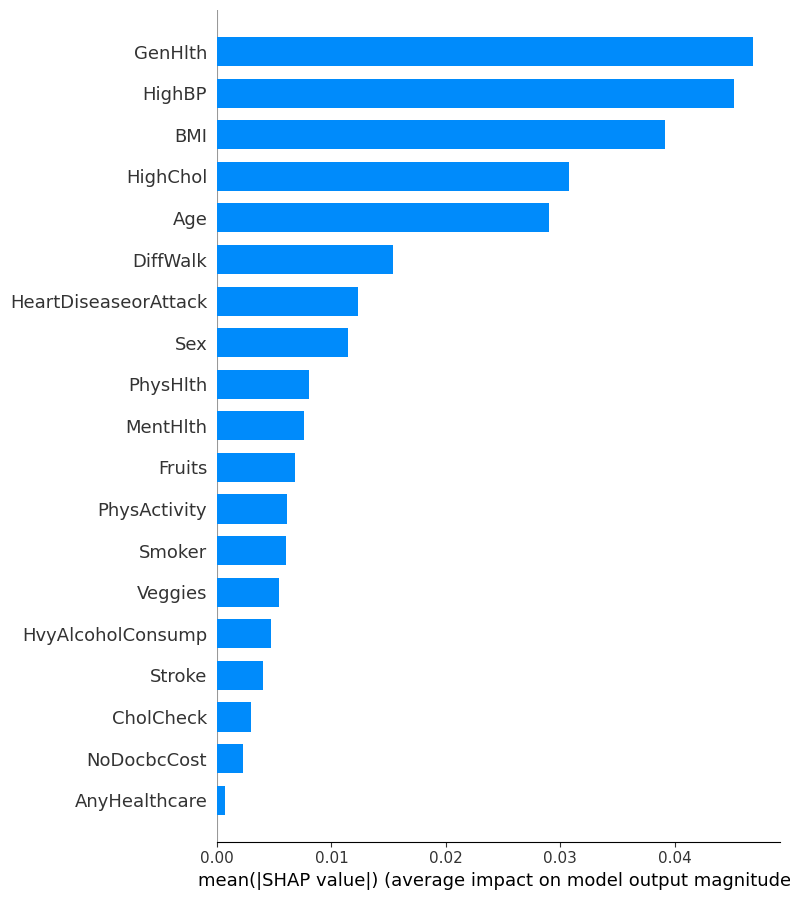

In [ ]:
import numpy as np

# Calculate mean absolute SHAP values across all classes for each feature
mean_shap_values = np.mean([np.abs(sv) for sv in shap_values], axis=0)  # Resulting shape should be (100, 12) to match X_sample

# If mean_shap_values is (12, 5), take the mean across classes, resulting in a vector (12, )
mean_shap_values = np.mean(mean_shap_values, axis=1)

# Repeat this vector to create a matrix that matches X_sample's shape
mean_shap_values_repeated = np.tile(mean_shap_values, (X_sample.shape[0], 1))

# Plot the summary plot with the repeated matrix
shap.summary_plot(mean_shap_values_repeated, X_sample, plot_type="bar", feature_names=X_sample.columns)


SHAP using Gradinet Boosting

In [ ]:
import shap

# Use a subset of the data for SHAP to reduce computation time
X_sample = X_test.sample(100, random_state=42)

# Initialize SHAP explainer for the Random Forest model
explainer = shap.TreeExplainer(gb_model)
shap_values = explainer.shap_values(X_sample)

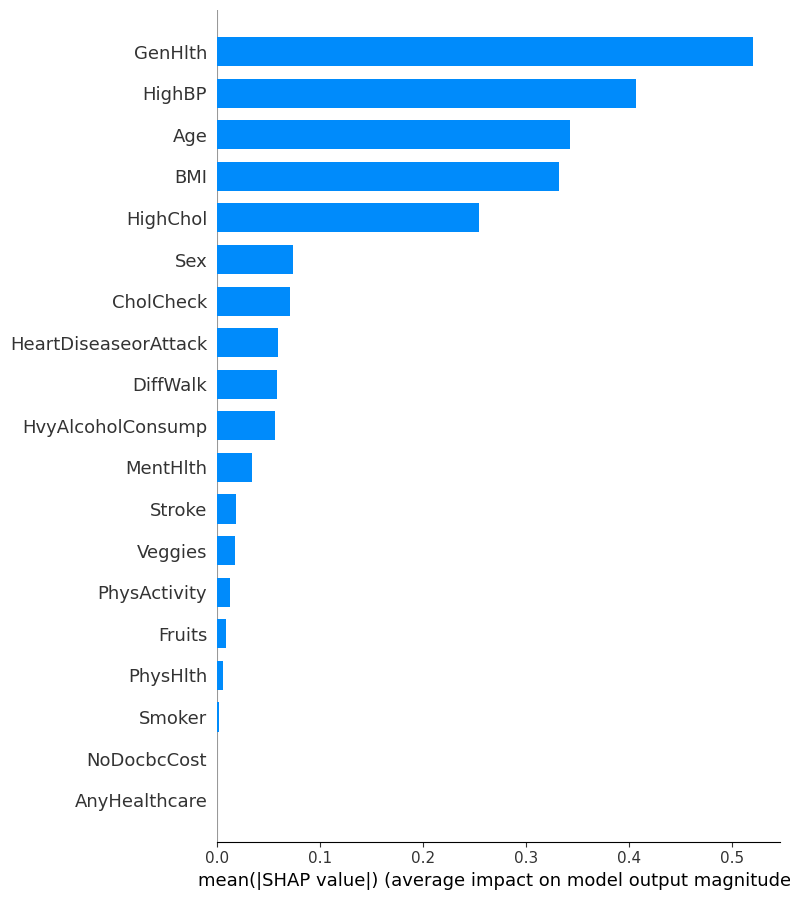

In [ ]:
import numpy as np

# Calculate mean absolute SHAP values across all classes for each feature
mean_shap_values = np.mean([np.abs(sv) for sv in shap_values], axis=0)  # Resulting shape should be (100, 12) to match X_sample

# If mean_shap_values is (12, 5), take the mean across classes, resulting in a vector (12, )
#mean_shap_values = np.mean(mean_shap_values, axis=1)

# Repeat this vector to create a matrix that matches X_sample's shape
mean_shap_values_repeated = np.tile(mean_shap_values, (X_sample.shape[0], 1))

# Plot the summary plot with the repeated matrix
shap.summary_plot(mean_shap_values_repeated, X_sample, plot_type="bar", feature_names=X_sample.columns)


LIME

In [ ]:
!pip install lime -q

In [ ]:
from lime.lime_tabular import LimeTabularExplainer

# Initialize the LIME explainer
lime_explainer = LimeTabularExplainer(X_train.values, feature_names=data_X.columns, class_names=y.values, mode='classification') #regression ( need to be changed)

# Choose a sample from the test set to explain
sample_index = 0  # Adjust to analyze a different sample
exp = lime_explainer.explain_instance(X_test.values[sample_index], rf_model.predict_proba, num_features=10)

# Display the explanation
exp.show_in_notebook()

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Explaination of Random Forest

In [ ]:
from lime.lime_tabular import LimeTabularExplainer

# Ensure class names are provided as a list of labels
lime_explainer = LimeTabularExplainer(
    X_train.values,  # Training data
    feature_names=X.columns,  # Feature names
    class_names=['Not Diabetic', 'Diabetic'],  # Class names
    mode='classification'  # Classification mode
)

# Choose a sample from the test set to explain
sample_index = 10  # Adjust to analyze a different sample
exp = lime_explainer.explain_instance(
    X_test.values[sample_index],  # Use pandas .iloc for correct indexing
    rf_model.predict_proba,  # Model's probability prediction
    num_features=10  # Number of features to explain
)

# Display the explanation in the notebook
exp.show_in_notebook()

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Explaination for Gradient Boosting

In [ ]:
from lime.lime_tabular import LimeTabularExplainer

# Ensure class names are provided as a list of labels
lime_explainer = LimeTabularExplainer(
    X_train.values,  # Training data
    feature_names=X.columns,  # Feature names
    class_names=['Not Diabetic', 'Diabetic'],  # Class names
    mode='classification'  # Classification mode
)

# Choose a sample from the test set to explain
sample_index = 10  # Adjust to analyze a different sample
exp = lime_explainer.explain_instance(
    X_test.values[sample_index],  # Use pandas .iloc for correct indexing
    gb_model.predict_proba,  # Model's probability prediction
    num_features=10  # Number of features to explain
)

# Display the explanation in the notebook
exp.show_in_notebook()

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(
